In [ ]:
# found recommendation for using yolov4-tiny over yolov7-tiny


In [4]:
import cv2
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
model_config = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/yolov4.cfg"
 
model_weights = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/yolov4.weights"

coco_names = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/coco.names"

In [6]:
def one_img_detect_objects(input, model_weights, model_config, coco_names):
    # Load YOLOv4
    net = cv2.dnn.readNet(model_weights, model_config)

    # Load COCO classes
    with open(coco_names, "r") as f:
        classes = [line.strip() for line in f.readlines()]

    layer_names = net.getLayerNames()
    output_layers = net.getUnconnectedOutLayersNames()

    # Check if input is a file path or an image
    if isinstance(input, str):
        img = cv2.imread(input)
        if img is None:
            print(f"Error loading image: {input}")
            return
    else:
        img = input.copy()

    img = cv2.resize(img, None, fx=0.4, fy=0.4)
    height, width, channels = img.shape

    # Detect objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Show detection on the image
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

                label = str(classes[class_id])
                cv2.putText(img, label, (x, y + 30), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 2)

    # Convert the image from BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display the image in the Jupyter notebook
    plt.imshow(img_rgb)
    plt.show()


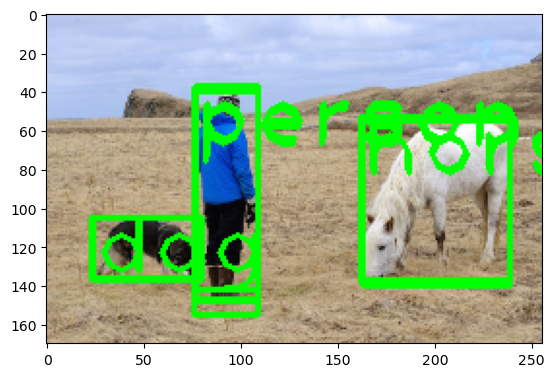

In [7]:
# Usage
one_img_detect_objects("/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/data/person.jpg", model_weights, model_config, coco_names)

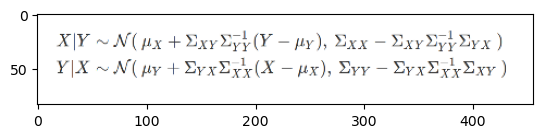

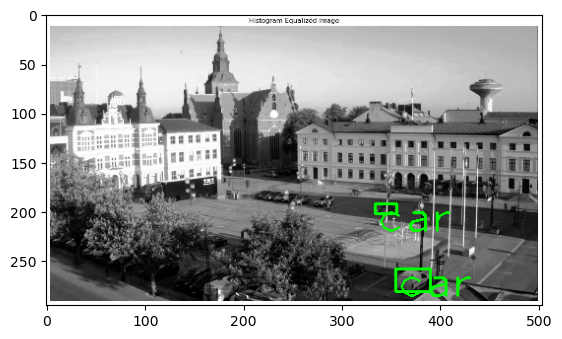

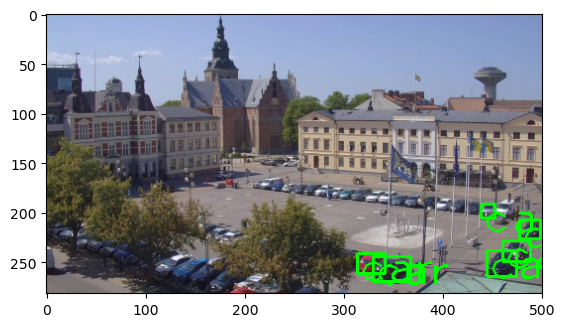

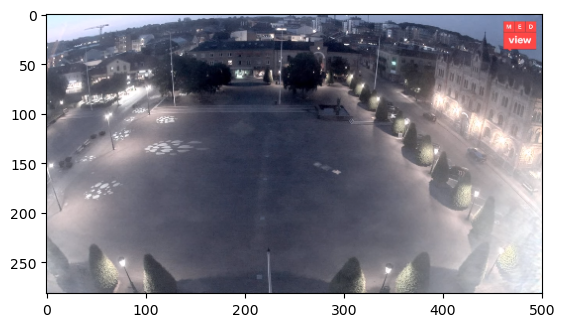

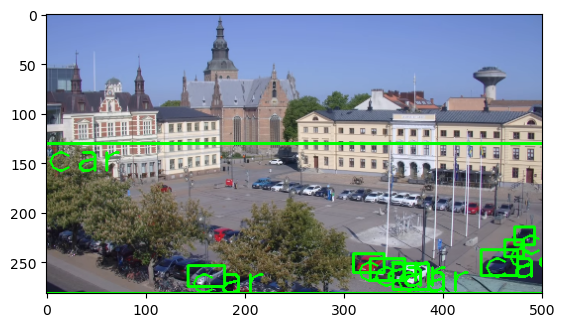

...

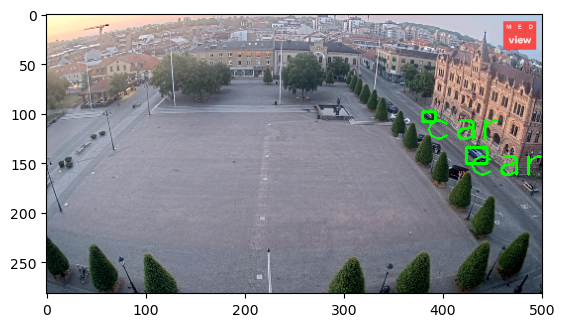

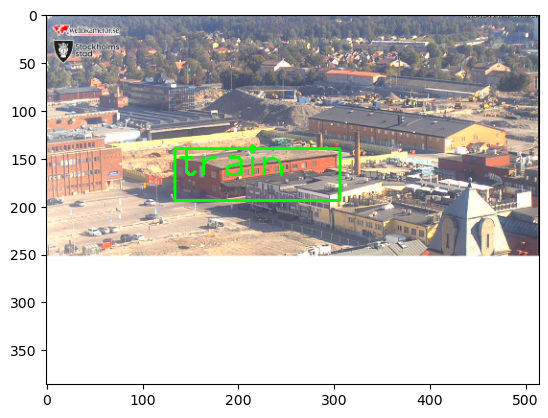

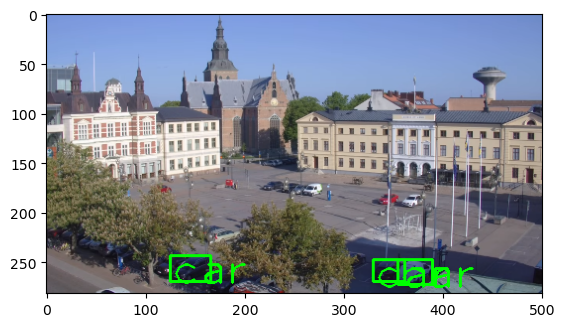

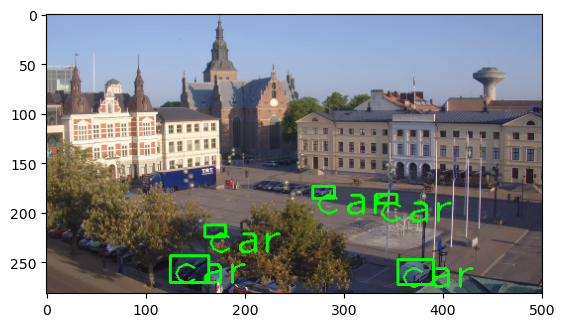

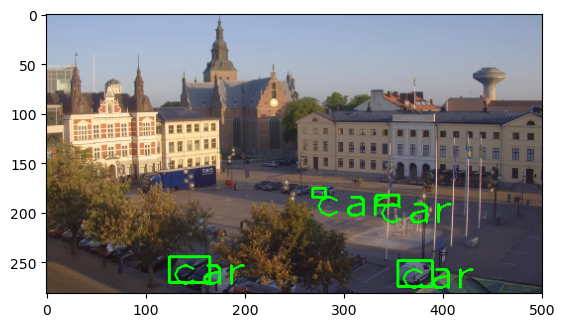

KeyboardInterrupt: 

In [8]:

def yolo_object_detection(image_folder):
    # Load YOLO
    model_config = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/yolov4.cfg"
 
    model_weights = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/yolov4.weights"

    coco_names = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/coco.names"
    
    net = cv2.dnn.readNet(model_weights, model_config)
    output_layers = net.getUnconnectedOutLayersNames()

    # Load names of classes
    classes = None
    with open(coco_names, 'r') as f:
        classes = [line.strip() for line in f.readlines()]

    # Initialize DataFrame to store results
    df = pd.DataFrame(columns=['Filename', 'Class', 'Count'])

    # Get list of all image paths in the folder
    image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]

    for image_path in image_paths:
        # Load image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error loading image: {image_path}")
            continue

        img = cv2.resize(img, None, fx=0.4, fy=0.4)
        height, width, channels = img.shape

        # Detecting objects
        blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
        net.setInput(blob)
        outs = net.forward(output_layers)

        # Showing informations on the screen
        class_ids = []
        confidences = []
        boxes = []
        for out in outs:
            for detection in out:
                scores = detection[5:]
                class_id = np.argmax(scores)
                confidence = scores[class_id]
                if confidence > 0.5:
                    # Object detected
                    center_x = int(detection[0] * width)
                    center_y = int(detection[1] * height)
                    w = int(detection[2] * width)
                    h = int(detection[3] * height)

                    # Rectangle coordinates
                    x = int(center_x - w / 2)
                    y = int(center_y - h / 2)

                    boxes.append([x, y, w, h])
                    confidences.append(float(confidence))
                    class_ids.append(class_id)

        indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

        # Count the occurrences of each class
        class_counts = dict()
        for i in range(len(boxes)):
            if i in indexes:
                class_name = str(classes[class_ids[i]])
                if class_name in class_counts:
                    class_counts[class_name] += 1
                else:
                    class_counts[class_name] = 1

        # Add to DataFrame
        for class_name, count in class_counts.items():
            df_temp = pd.DataFrame({'Filename': [image_path], 'Class': [class_name], 'Count': [count]})
            df = pd.concat([df, df_temp], ignore_index=True)

        # Uncomment the following lines to see the detection results on a particular image
        for i in range(len(boxes)):
            if i in indexes:
                x, y, w, h = boxes[i]
                label = str(classes[class_ids[i]])
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(img, label, (x, y + 30), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 2)

        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()


    return df

image_folder = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/"
df = yolo_object_detection(image_folder)
#print(df)


In [11]:
df

,Filename,Class,Count
0,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,6
1,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,8
2,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,4
3,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,2
4,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,1
5,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,train,1
6,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,4
7,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,bus,1
8,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,1
9,/home/sf_afn/Insync/sofiaa720@gmail.com/Google...,car,4


<h2>Preprocessing images to improve yolo?


The resolution of the image is 1253x705
The resolution of the cropped image is 1200x305


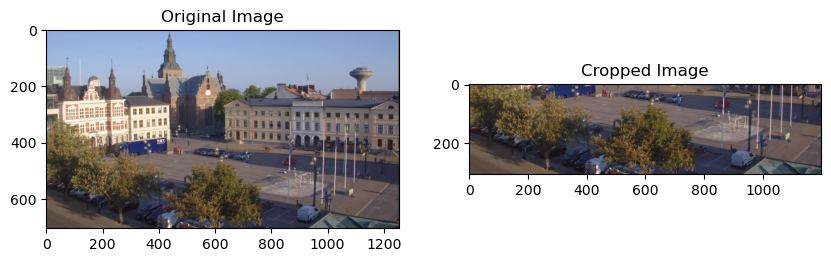

In [28]:
# cropping
# might need diff paramerters for each area - start with kris


# Load the image
img = cv2.imread('/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-0611.png')

# Get the resolution
height, width, _ = img.shape

print(f"The resolution of the image is {width}x{height}")

# OpenCV reads images in BGR format, we convert it to RGB to display it with correct colors
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define the region of interest (ROI)
# The format is img[y:y+h, x:x+w]
y = 400
h =500
x =0
w = 1200
crop_img = img[y:y+h, x:x+w]  # This will crop the image at (x, y) = (100, 50) with width 200 and height 150

# Convert cropped image to RGB
crop_img_rgb = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)

# Get the resolution
height, width, _ = crop_img_rgb.shape

print(f"The resolution of the cropped image is {width}x{height}")

# Display the original and cropped image side by side
plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(crop_img_rgb)
plt.title('Cropped Image')

plt.show()


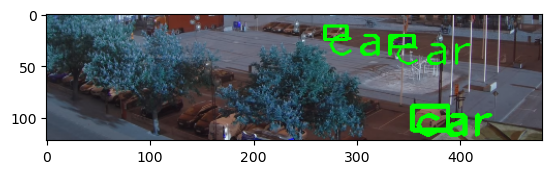

In [13]:
# Usage
one_img_detect_objects(crop_img_rgb, model_weights, model_config, coco_names)

<h2>Yolo v8

In [1]:
from ultralytics import YOLO
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import cv2

In [2]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.147 🚀 Python-3.11.4 torch-2.0.1+cpu CPU (13th Gen Intel Core(TM) i7-13700KF)
Setup complete ✅ (24 CPUs, 31.2 GB RAM, 264.8/937.3 GB disk)


In [3]:
from ultralytics import YOLO

# Load a model
# model = YOLO('yolov8n.yaml')  # build a new model from scratch
model = YOLO('/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/notebooks/yolov8n.pt')  # load a pretrained model (recommended for training)

# Use the model
# results = model.train(data='coco128.yaml', epochs=3)  # train the model
# results = model.val()  # evaluate model performance on the validation set
results = model('/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/notebooks/bus.jpg')  # predict on an image
#results = model.export(format='onnx')  # export the model to ONNX format



image 1/1 /home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/notebooks/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 28.0ms
Speed: 1.2ms preprocess, 28.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


In [4]:

def box_label(image, box, label='car', color=(128, 128, 128), txt_color=(255, 255, 255)):
  lw = max(round(sum(image.shape) / 2 * 0.001), 1)
  p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
  cv2.rectangle(image, p1, p2, color, thickness=lw, lineType=cv2.LINE_AA)
  if label:
    tf = max(lw - 1, 1)  # font thickness
    # Reduced font scale for smaller text
    font_scale = lw / 4 # Adjust the divisor as needed
    w, h = cv2.getTextSize(label, 0, fontScale=lw / 4, thickness=tf)[0]  # text width, height
    outside = p1[1] - h >= 3
    p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
    cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
    cv2.putText(image,
                label, 
                (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                lw / 3,
                txt_color,
                thickness=tf,
                lineType=cv2.LINE_AA)

def plot_bboxes(image, boxes, labels=[], colors=[], score=True, conf=None):
  #Define COCO Labels
  if labels == []:
    labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird'}
  #Define colors
  if colors == []:
    colors = [(6, 112, 83), (253, 246, 160), (40, 132, 70), (205, 97, 162), (149, 196, 30), (106, 19, 161), (127, 175, 225), (115, 133, 176), (83, 156, 8), (182, 29, 77), (180, 11, 251), (31, 12, 123), (23, 6, 115), (167, 34, 31), (176, 216, 69), (110, 229, 222)]
    # colors = [(89, 161, 197),(67, 161, 255),(19, 222, 24),(186, 55, 2),(167, 146, 11),(190, 76, 98),(130, 172, 179),(115, 209, 128),(204, 79, 135),(136, 126, 185),(209, 213, 45),(44, 52, 10),(101, 158, 121),(179, 124, 12),(25, 33, 189),(45, 115, 11),(73, 197, 184),(62, 225, 221),(32, 46, 52),(20, 165, 16),(54, 15, 57),(12, 150, 9),(10, 46, 99),(94, 89, 46),(48, 37, 106),(42, 10, 96),(7, 164, 128),(98, 213, 120),(40, 5, 219),(54, 25, 150),(251, 74, 172),(0, 236, 196),(21, 104, 190),(226, 74, 232),(120, 67, 25),(191, 106, 197),(8, 15, 134),(21, 2, 1),(142, 63, 109),(133, 148, 146),(187, 77, 253),(155, 22, 122),(218, 130, 77),(164, 102, 79),(43, 152, 125),(185, 124, 151),(95, 159, 238),(128, 89, 85),(228, 6, 60),(6, 41, 210),(11, 1, 133),(30, 96, 58),(230, 136, 109),(126, 45, 174),(164, 63, 165),(32, 111, 29),(232, 40, 70),(55, 31, 198),(148, 211, 129),(10, 186, 211),(181, 201, 94),(55, 35, 92),(129, 140, 233),(70, 250, 116),(61, 209, 152),(216, 21, 138),(100, 0, 176),(3, 42, 70),(151, 13, 44),(216, 102, 88),(125, 216, 93),(171, 236, 47),(253, 127, 103),(205, 137, 244),(193, 137, 224),(36, 152, 214),(17, 50, 238),(154, 165, 67),(114, 129, 60),(119, 24, 48),(73, 8, 110)]
  
  #plot each boxes
  for box in boxes:
    #add score in label if score=True
    if score :
      label = labels[int(box[-1])+1] + " " + str(round(100 * float(box[-2]),1)) + "%"
    else :
      label = labels[int(box[-1])+1]
    #filter every box under conf threshold if conf threshold setted
    if conf :
      if box[-2] > conf:
        color = colors[int(box[-1])]
        box_label(image, box, label, color)
    else:
      color = colors[int(box[-1])]
      box_label(image, box, label, color)

  #show image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # try:
  #   import google.colab
  #   IN_COLAB = True
  # except:
  #   IN_COLAB = False

  if IN_COLAB:
    cv2_imshow(image) #if used in Colab
  else :
    cv2.imshow(image) #if used in Python

In [5]:
# result
result= model.predict('/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png', show= True)


image 1/1 /home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/Kris_0706-1447.png: 384x640 26 cars, 22.1ms
Speed: 1.1ms preprocess, 22.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


In [6]:
cv2.destroyAllWindows() 